In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import os
import cv2 as cv
%matplotlib nbagg

In [2]:
base = "D:\ENTC\PROJECTS\signal-processing\sp_files\\"
file_5 = base + "notes-5.wav"
file_6 = base + "notes-6.wav"
file_8 = base + "notes-8.wav"
file_9 = base + "notes-9.wav"
file_10 = base + "notes-10.wav"
file_11 = base + "notes-11.wav"
file_12 = base + "notes-12.wav"
file_13 = base + "notes-13.wav"

ipd.Audio(file_13,autoplay=1)


In [3]:
#loading audio files with librosa

audio_5, sr = librosa.load(file_13)

### Select suitable frame size and hop size

<IPython.core.display.Javascript object>


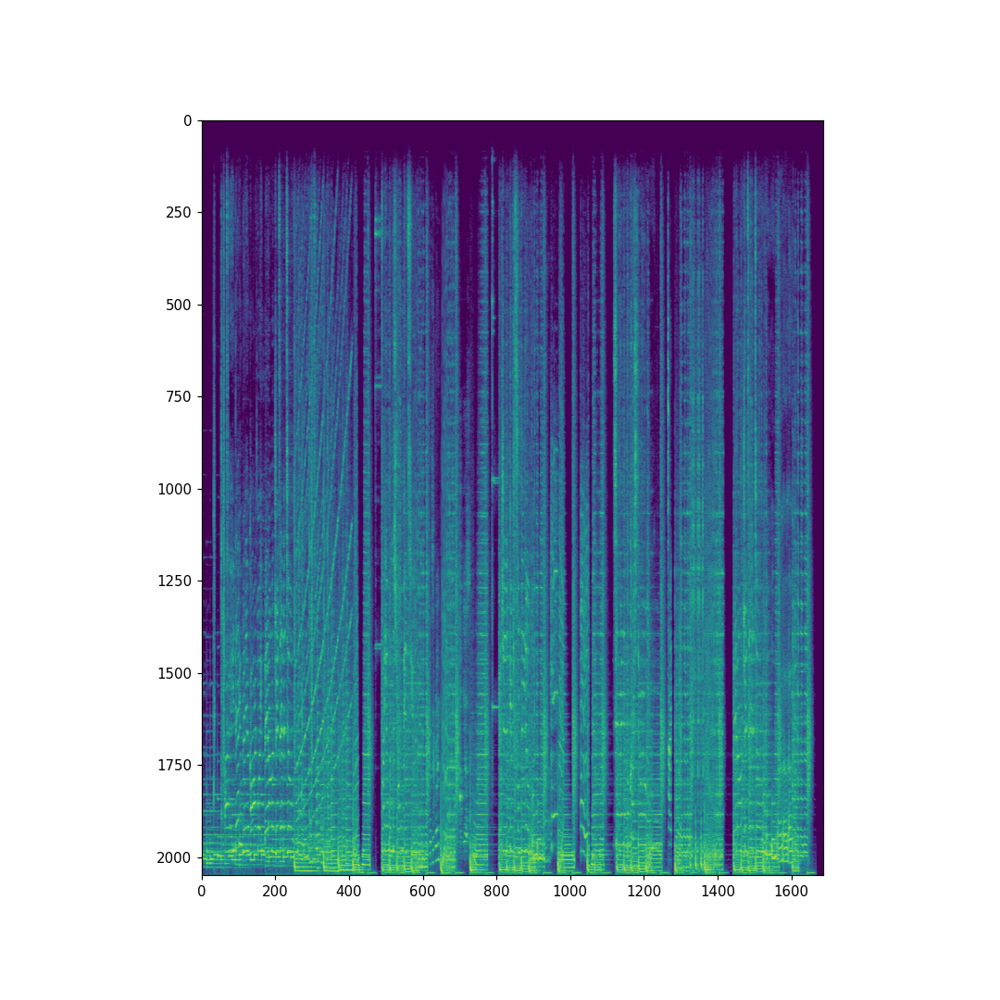

frame length in secs: 0.18575963718820862


In [4]:


frame_size = 2**12
hop_size = 2**9

S_audio_5 = np.abs(librosa.stft(audio_5,hop_length=hop_size,n_fft=frame_size))**2

#S_audio_5 = cv.equalizeHist(S_audio_5)
S_audio_5 = librosa.power_to_db(S_audio_5)
S_audio_5 = np.flip(S_audio_5,axis=0)



fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(S_audio_5)
plt.show()
print("frame length in secs:",frame_size/sr)

<IPython.core.display.Javascript object>


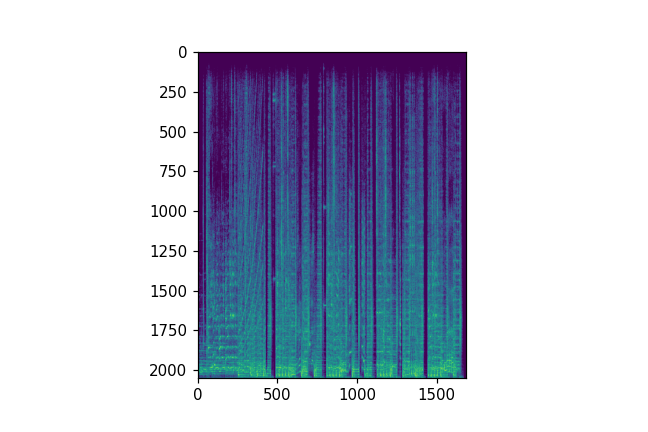

In [5]:
#eroding the spectrum
erode_kernel = np.ones((3,3),dtype=np.uint8)
eroded_S_audio_5 =cv.erode(S_audio_5,erode_kernel)

fig,ax = plt.subplots(1,1)
ax.imshow(eroded_S_audio_5)
plt.show()

<IPython.core.display.Javascript object>


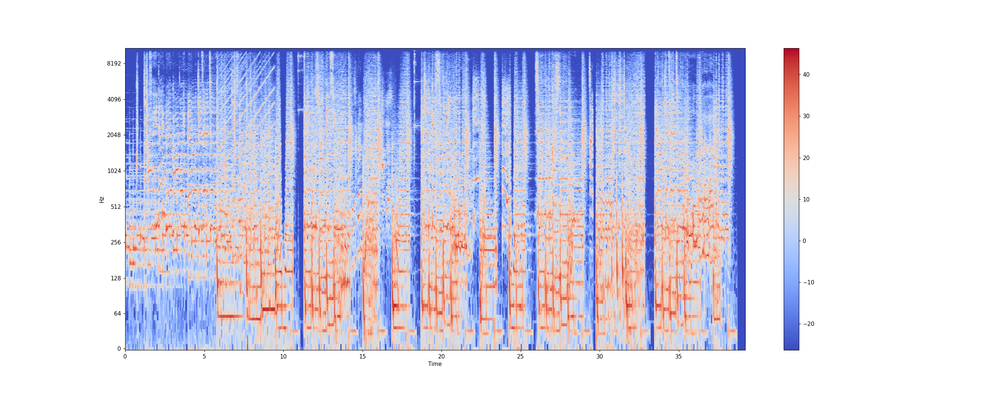

In [6]:
#try log scale (y - axis)
plt.figure(figsize=(25,10))
eroded_S_audio_5_lr = np.flip(eroded_S_audio_5,axis=0)
librosa.display.specshow(eroded_S_audio_5_lr,sr=sr,x_axis="time",y_axis="log",hop_length=hop_size)
plt.colorbar()

## Trying mel-spectrograms


C:\Users\R3KI3G\AppData\Local\Programs\Python\Python39\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)


<IPython.core.display.Javascript object>


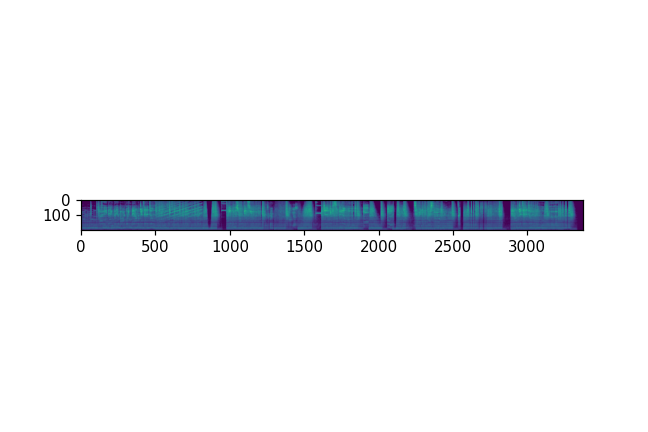

frame length in secs: 0.011609977324263039


<IPython.core.display.Javascript object>


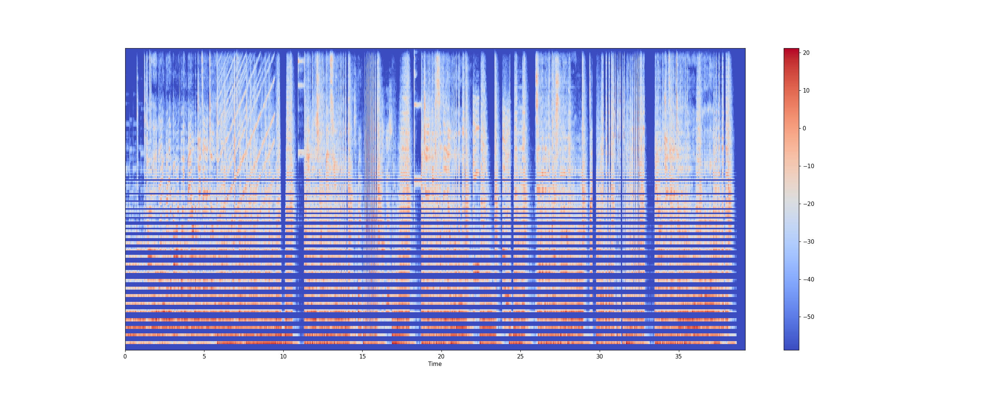

In [7]:
frame_size = 2**8
hop_size = 2**8

#S_audio_5 = np.abs(librosa.stft(audio_5,hop_length=hop_size,n_fft=frame_size))**2
S_audio_5 = librosa.feature.melspectrogram(y=audio_5, sr=sr,
                                            n_fft=frame_size, hop_length=hop_size,n_mels=200)
#S_audio_5 = np.log(S_audio_5 + 1e-9)
#S_audio_5 = cv.equalizeHist(S_audio_5)
S_audio_5 = librosa.power_to_db(S_audio_5)
S_audio_5 = np.flip(S_audio_5,axis=0)



fig,ax = plt.subplots(1,1)
ax.imshow(S_audio_5)
plt.show()
print("frame length in secs:",frame_size/sr)


#try log scale (y - axis)
plt.figure(figsize=(25,10))
S_audio_5 = np.flip(S_audio_5,axis=0)
librosa.display.specshow(S_audio_5,sr=sr,x_axis="time",hop_length=hop_size)
plt.colorbar()